*Compiled on Feb 13, 2019 with scanpy v.1.4   

# Human spleen

Scanpy allows to reproduce most of Seurat's ([Satija *et al.*, 2015](https://doi.org/10.1038/nbt.3192)) standard clustering tutorial as described on http://satijalab.org/seurat/pbmc3k_tutorial.html (July 26, 2017). We gratefully acknowledge  the Seurat authors for publishing the tutorial!


In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import bbknn
#import scrublet as scr
import bbknn
import os
from collections import Counter

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis')
sc.logging.print_versions()
results_file = 'spleen5.h5ad'
path = '/home/jovyan/tisstab/data/' #Input your directory with files
os.chdir(path)

In [ ]:
#%load_ext autoreload
#%autoreload 2

def update_label(from_adata,from_label,to_adata,old_label,new_label,exclude=None,include=None,replace=False):
    if new_label in to_adata.obs.columns:
        if replace==False:
            raise SystemError
        if replace==True:
            i =  1
            while True:
                new_key = new_label+'.replaced.'+str(i)
                if new_key in to_adata.obs.columns:
                    continue
                else:
                    to_adata.obs[new_key] = list(to_adata.obs[new_label])
                    break
    if exclude:
        ON = {O:N for O,N in zip(from_adata.obs_names,from_adata.obs[from_label]) if N not in exclude}
    elif include:
        ON = {O:N for O,N in zip(from_adata.obs_names,from_adata.obs[from_label]) if N in include}
    else:
        ON = {O:N for O,N in zip(from_adata.obs_names,from_adata.obs[from_label])}
    to_adata.obs[new_label] = [ON[O] if O in ON else N for O,N in zip(to_adata.obs_names,to_adata.obs[old_label])]
    
    

def calculate_markers(adata,group_key,exclude = None, cnt_cut=3, tot_cnt_cut=10):

    # group_key = 'louvain'

    ctlist = np.array(sorted(list(set(adata.obs[group_key]))))
    
    if exclude:
        ctlist = [x for x in ctlist if x not in exclude]
    
    mtx = adata.raw
    len_gene = mtx.X.shape[1]

    mean_dt = {}
    cnt_dt = {}
    drop_dt = {}

    for ct in ctlist:
        ct_cond = adata.obs[group_key]==ct
        if np.sum(ct_cond)<tot_cnt_cut:
            continue
        print(ct)
        len_ct = np.sum(ct_cond)
        mtx_ct = mtx[ct_cond].X
        pos_count = Counter(mtx_ct.nonzero()[1])
        cnt_arr = np.zeros(len_gene)
        for pos in pos_count:
            cnt_arr[pos] = pos_count[pos]
        cnt_dt[ct] = cnt_arr
        cnt_mask = (cnt_arr<cnt_cut)
        drop_dt[ct] = cnt_arr/len_ct
        mean_arr = np.mean(mtx_ct,axis=0).A1
        mean_arr[cnt_mask] = 0
        mean_dt[ct] = mean_arr
    
    cdm_out = {"cnt":cnt_dt, "drop":drop_dt, "mean":mean_dt}
    return cdm_out

def draw_marker_blob(adata,cdm_out,genes,ctlist = None,fontsize=10, figscale=0.25,save=None, show=True, min_drop_ratio=0.01):

    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    if ctlist == None:
        ctlist = np.array(sorted(list(drop_dt.keys())))

    xpos = []
    ypos = []
    yticks = []
    yticklabels = []

    x1 = []
    y1 = []

    yidx = 0
    
    for gene in genes[::-1]:

        if gene in adata.raw.var_names:
            yidx += 1
            k = np.where(adata.raw.var_names == gene)[0][0]

            x1.extend([drop_dt[ct][k] if drop_dt[ct][k] > min_drop_ratio else 0 for ct in ctlist])
            y0 = np.array([mean_dt[ct][k] for ct in ctlist])
            y1.extend(list(y0/np.max(y0)))
            
            yticks.append(yidx)
            yticklabels.append(gene)
            
        else:

            yidx += 0.5
            x1.extend([0]*len(ctlist))
            y1.extend([0]*len(ctlist))
                                   
        xpos.extend(list(range(len(ctlist))))
        ypos.extend([yidx]*len(ctlist))

    x1 = np.array(x1)
    y1 = np.array(y1)
    
    fig = plt.figure(figsize=(len(ctlist)*figscale,len(genes)*figscale*0.9))
    ax = fig.add_subplot(1,1,1)
    sc = ax.scatter(xpos,ypos,s=x1*figscale*400,c=y1,cmap='OrRd')
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels,fontsize=fontsize)
    ax.set_xticks(range(len(ctlist)))
    ax.set_xticklabels(ctlist,rotation=90,fontsize=fontsize)
    ax.set_ylim(min(ypos)-0.5,max(ypos)+0.5)
    ax.set_xlim(min(xpos)-0.5,max(xpos)+0.5)
    plt.grid(False)
    
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(sc,cax=cax)
    cbar.ax.tick_params(labelsize=8) 
    
    if save:
        plt.savefig(save,format='pdf')
    if show:
        plt.show()
    

In [734]:
metadata = pd.read_csv('allsamples.csv', sep = ',', index_col = 0)

metadata = metadata.loc[metadata['organ'] == 'Spleen']
# Exclude bad sample
metadata = metadata.drop(['HCATisStabAug177276393'])

metadata['Donor']= metadata['patient']
metadata['Time']=metadata['timepoint']
metadata['donor_time']=metadata['Donor'] + '_' + metadata['Time']
metadata['time_donor']=metadata['Time'] + '_' + metadata['Donor']

metadata.head()

,organ,patient,timepoint,Donor,Time,donor_time,time_donor
sample,,,,,,,
HCATisStab7463846,Spleen,337C,0h,337C,0h,337C_0h,0h_337C
HCATisStab7463847,Spleen,337C,12h,337C,12h,337C_12h,12h_337C
HCATisStab7463848,Spleen,337C,24h,337C,24h,337C_24h,24h_337C
HCATisStab7463849,Spleen,337C,72h,337C,72h,337C_72h,72h_337C
HCATisStab7587200,Spleen,356C,0h,356C,0h,356C_0h,0h_356C


In [735]:

filenames = metadata.index
adatas = [sc.read_10x_mtx(path + filename + '/filtered_gene_bc_matrices/GRCh38/') for filename in filenames]
for i in range(len(adatas)):
    adatas[i].obs['sample'] = metadata.index[i]
    for col in metadata.columns:
        adatas[i].obs[col] = metadata[col][i]
adata = adatas[0].concatenate(adatas[1:], batch_categories = metadata.index)
adata

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading fr

AnnData object with n_obs × n_vars = 122210 × 33694 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint'
    var: 'gene_ids-HCATisStab7463846', 'gene_ids-HCATisStab7463847', 'gene_ids-HCATisStab7463848', 'gene_ids-HCATisStab7463849', 'gene_ids-HCATisStab7587200', 'gene_ids-HCATisStab7587203', 'gene_ids-HCATisStab7587206', 'gene_ids-HCATisStab7587209', 'gene_ids-HCATisStabAug177078016', 'gene_ids-HCATisStabAug177078017', 'gene_ids-HCATisStabAug177078018', 'gene_ids-HCATisStabAug177078019', 'gene_ids-HCATisStabAug177276391', 'gene_ids-HCATisStabAug177276392', 'gene_ids-HCATisStabAug177276394', 'gene_ids-HCATisStabAug177376561', 'gene_ids-HCATisStabAug177376563', 'gene_ids-HCATisStabAug177376565', 'gene_ids-HCATisStabAug177376567'

In [736]:
#adata.write('spleen.h5ad')


In [737]:
#adata = sc.read('spleen.h5ad')

In [738]:
adata

AnnData object with n_obs × n_vars = 122210 × 33694 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint'
    var: 'gene_ids-HCATisStab7463846', 'gene_ids-HCATisStab7463847', 'gene_ids-HCATisStab7463848', 'gene_ids-HCATisStab7463849', 'gene_ids-HCATisStab7587200', 'gene_ids-HCATisStab7587203', 'gene_ids-HCATisStab7587206', 'gene_ids-HCATisStab7587209', 'gene_ids-HCATisStabAug177078016', 'gene_ids-HCATisStabAug177078017', 'gene_ids-HCATisStabAug177078018', 'gene_ids-HCATisStabAug177078019', 'gene_ids-HCATisStabAug177276391', 'gene_ids-HCATisStabAug177276392', 'gene_ids-HCATisStabAug177276394', 'gene_ids-HCATisStabAug177376561', 'gene_ids-HCATisStabAug177376563', 'gene_ids-HCATisStabAug177376565', 'gene_ids-HCATisStabAug177376567'

## Preprocessing

Basic filtering.

In [739]:
sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 22435 cells that have less than 300 genes expressed
filtered out 11082 genes that are detected in less than 3 cells


Plot some information about mitochondrial genes, important for quality control. Note that you can also retrieve mitochondrial genes using `sc.queries.mitochondrial_genes_biomart('www.ensembl.org', 'mmusculus')`.

In [740]:
mito_genes = [name for name in adata.var_names if name.startswith('MT-')]
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1


A violin plot of the computed quality measures.

In [10]:
%pylab inline
pylab.rcParams['figure.figsize'] = (12, 6)

Populating the interactive namespace from numpy and matplotlib


In [ ]:


#sc.pl.violin(adata, ['n_genes'],
            jitter=0.4, groupby='donor_time', rotation=90)
#sc.pl.violin(adata, ['n_counts'],
            jitter=0.4, groupby='donor_time', rotation=90)
#sc.pl.violin(adata, ['percent_mito'],
            jitter=0.4, groupby='donor_time', rotation=90)

Actually do the filtering.

In [742]:
adata = adata[adata.obs['n_genes'] < 5000, :]
adata = adata[adata.obs['percent_mito'] < 0.1, :]
adata = adata[adata.obs['n_counts'] < 20000, :]

In [743]:
adata

View of AnnData object with n_obs × n_vars = 94257 × 22612 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids-HCATisStab7463846', 'gene_ids-HCATisStab7463847', 'gene_ids-HCATisStab7463848', 'gene_ids-HCATisStab7463849', 'gene_ids-HCATisStab7587200', 'gene_ids-HCATisStab7587203', 'gene_ids-HCATisStab7587206', 'gene_ids-HCATisStab7587209', 'gene_ids-HCATisStabAug177078016', 'gene_ids-HCATisStabAug177078017', 'gene_ids-HCATisStabAug177078018', 'gene_ids-HCATisStabAug177078019', 'gene_ids-HCATisStabAug177276391', 'gene_ids-HCATisStabAug177276392', 'gene_ids-HCATisStabAug177276394', 'gene_ids-HCATisStabAug177376561', 'gene_ids-HCATisStabAug177376563', 'gene_ids-HCATisStabAug177376565', 'gene_ids-HCATisStabAug177376567', 'n_cells'

Set the `.raw` attribute of AnnData object to the logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object returned by `sc.pp.log1p`.

In [744]:
adata.raw = sc.pp.log1p(adata, copy=True)

Per-cell normalize the data matrix $\mathbf{X}$. Many people would consider the normalized data matrix as the "relevant data" for visualization and differential testing (assessing feature importance).

In [745]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

Identify highly-variable genes.

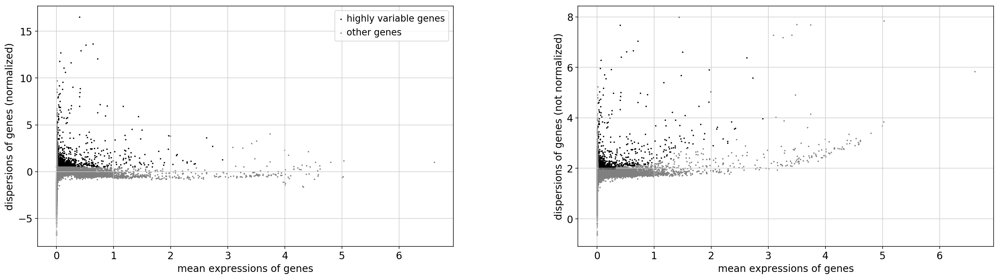

In [746]:
filter_result = sc.pp.filter_genes_dispersion(
    adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result)

In [747]:
adata

AnnData object with n_obs × n_vars = 94257 × 22612 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids-HCATisStab7463846', 'gene_ids-HCATisStab7463847', 'gene_ids-HCATisStab7463848', 'gene_ids-HCATisStab7463849', 'gene_ids-HCATisStab7587200', 'gene_ids-HCATisStab7587203', 'gene_ids-HCATisStab7587206', 'gene_ids-HCATisStab7587209', 'gene_ids-HCATisStabAug177078016', 'gene_ids-HCATisStabAug177078017', 'gene_ids-HCATisStabAug177078018', 'gene_ids-HCATisStabAug177078019', 'gene_ids-HCATisStabAug177276391', 'gene_ids-HCATisStabAug177276392', 'gene_ids-HCATisStabAug177276394', 'gene_ids-HCATisStabAug177376561', 'gene_ids-HCATisStabAug177376563', 'gene_ids-HCATisStabAug177376565', 'gene_ids-HCATisStabAug177376567', 'n_cells'

In [748]:
fulldata=adata
fulldata.write('spleen.full.h5ad')

In [749]:
adata = adata[:, filter_result.gene_subset]

In [750]:
adata

View of AnnData object with n_obs × n_vars = 94257 × 1725 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids-HCATisStab7463846', 'gene_ids-HCATisStab7463847', 'gene_ids-HCATisStab7463848', 'gene_ids-HCATisStab7463849', 'gene_ids-HCATisStab7587200', 'gene_ids-HCATisStab7587203', 'gene_ids-HCATisStab7587206', 'gene_ids-HCATisStab7587209', 'gene_ids-HCATisStabAug177078016', 'gene_ids-HCATisStabAug177078017', 'gene_ids-HCATisStabAug177078018', 'gene_ids-HCATisStabAug177078019', 'gene_ids-HCATisStabAug177276391', 'gene_ids-HCATisStabAug177276392', 'gene_ids-HCATisStabAug177276394', 'gene_ids-HCATisStabAug177376561', 'gene_ids-HCATisStabAug177376563', 'gene_ids-HCATisStabAug177376565', 'gene_ids-HCATisStabAug177376567', 'n_cells'

Logarithmize the data.

In [751]:
sc.pp.log1p(adata)

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [752]:
sc.pp.regress_out(adata, ['n_counts'])

regressing out ['n_counts']
    sparse input is densified and may lead to high memory use
    finished (0:02:52.43)


In [753]:
sc.pp.regress_out(adata, ['percent_mito'])

regressing out ['percent_mito']
    finished (0:01:44.66)


In [754]:
sc.pp.regress_out(adata, ['Donor'])

regressing out ['Donor']
    finished (0:02:47.90)


In [755]:
sc.pp.scale(adata, max_value=10)

Save the result.

In [756]:
#adata.write('spleen.h5ad')

## PCA

Compute PCA and make a scatter plot.

In [757]:
sc.tl.pca(adata)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.


In [758]:
adata.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat

In [759]:
#adata.write('spleen.h5ad')

In [760]:
#adata = sc.read('spleen.h5ad')

In [761]:
adata

AnnData object with n_obs × n_vars = 94257 × 1725 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids-HCATisStab7463846', 'gene_ids-HCATisStab7463847', 'gene_ids-HCATisStab7463848', 'gene_ids-HCATisStab7463849', 'gene_ids-HCATisStab7587200', 'gene_ids-HCATisStab7587203', 'gene_ids-HCATisStab7587206', 'gene_ids-HCATisStab7587209', 'gene_ids-HCATisStabAug177078016', 'gene_ids-HCATisStabAug177078017', 'gene_ids-HCATisStabAug177078018', 'gene_ids-HCATisStabAug177078019', 'gene_ids-HCATisStabAug177276391', 'gene_ids-HCATisStabAug177276392', 'gene_ids-HCATisStabAug177276394', 'gene_ids-HCATisStabAug177376561', 'gene_ids-HCATisStabAug177376563', 'gene_ids-HCATisStabAug177376565', 'gene_ids-HCATisStabAug177376567', 'n_cells'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## BBKNN correction and UMAP plot

In [762]:
bbknn.bbknn(adata, batch_key='patient',neighbors_within_batch = 4)
sc.tl.umap(adata)

computing batch balanced neighbors
    finished (0:00:36.74) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:04:40.41) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [763]:
sc.tl.leiden(adata, resolution=0.9)


running Leiden clustering
    finished (0:02:41.79) --> found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)


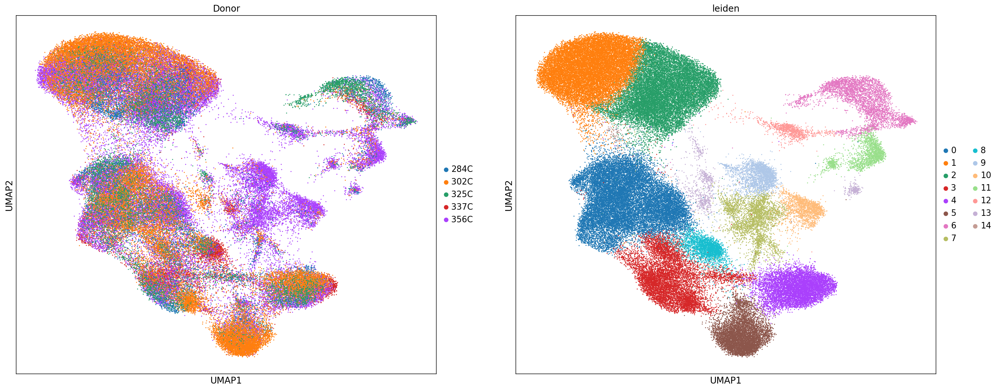

In [764]:
pylab.rcParams['figure.figsize'] = (12, 10)

sc.pl.umap(adata,color=['Donor','leiden'], size=10)

In [765]:
#adata.write('/home/jovyan/tisstab/data/spleen.h5ad')

In [766]:
marker_genes = ['PTPRC',#immune
                  'CD14', 'VCAN', 'FCN1', #Monocyte
                  'APOE', 'CD5L',#Macrophage
                  'IL3RA', 'CLEC4C', #plasmacytoid DC
                'CLEC9A', 'XCR1', #cDC1
                  'CD1C',  'CLEC10A', #cDC2
                  'CD34', 'PROM1', 'HOXA9', #Cd34 progenitor
                  'GP9', 'PF4', 'PPBP'#platelets
                
                  'CD19', 'CD79A', 'MS4A1', #B-cell
                  'CR2', 'CD27',  'TNFRSF13B', #Mantle B cells
                  'IGHD', 'FCER2', 'TCL1A', 'YBX3', 'IL4R', #Follicular B cells
                  'AICDA', #Somatic hypermutation B-cells
                  'SDC1', 'XBP1', 'JCHAIN', #Plasma cells
                  'IGHM', 'IGHG1', #Plasma cells
                
                  'MKI67', 'TUBB', 'H2AFZ','CDK1', #Dividing
                
                  'CD3E','CD4', 'CD8A', #T-cells CD4 or CD8
                        'GZMB', 'GNLY', 'PRF1',#Cytotoxic T CTL
                'FCGR3A', 'TRGV2' ,#gamma delta T-cells
                        'SLC4A10',  'KLRB1' ,#MAIT cells
                       'LEF1', 'CCR7', #Naive
                        'FOXP3', 'IL2RA', #Treg
                       'CXCR5', 'ICOS', 'PDCD1',  #Tfh 
                  'IL7R', 'KLRB1', 'AREG', 'TNFSF13B', #ILC
                  'NCR1', 'NCAM1', 'CD160', 'FCGR3A' #NK
                        ]

Visualize markers

In [31]:

#sc.pl.umap(adata,color=['CD3E','CD4', 'CD8A','CD27',  'TNFRSF13B','YBX3',
#                        'NCR1','CD160', 'FCGR3A' ,'CD14', 'CLEC9A','CLEC10A', 
#                        'MKI67','JCHAIN','IGHM', 'IGHG1' ], size=20)

Clusters are renamed based on known markers

In [768]:
new_cluster_names = [
    'CD4', 'B_mantle',
    'B_follicular', 'CD8_1',
    'NK_FCGR3Apos', 'NK_CD160pos',
    'Monocyte', 'Dividing',
    'CD8_2', 'Plasma_IgM',
    'Plasma_IgG', 'Dendritic', 
    'Macrophage', 'Small_populations',
'Unknown']
conv = {str(i):name for i,name in enumerate(new_cluster_names)}

adata.obs['Celltype'] = [conv[x] for x in adata.obs['leiden']]

In [769]:
adata.obs.Celltype.value_counts()

CD4                  19225
B_mantle             18513
B_follicular         16286
CD8_1                 8594
NK_FCGR3Apos          7458
NK_CD160pos           6400
Monocyte              3878
Dividing              3091
CD8_2                 2579
Plasma_IgM            2488
Plasma_IgG            1800
Dendritic             1768
Macrophage            1035
Small_populations     1014
Unknown                128
Name: Celltype, dtype: int64

In [770]:
adata.write('spleen.h5ad')

... storing 'Celltype' as categorical


## Subsetting and finer annotation of the T lymphocytes

In [771]:
#adata = sc.read('/home/jovyan/tisstab/data/spleen.h5ad')
#fulldata=sc.read('/home/jovyan/tisstab/data/spleen.full.h5ad')
#tiss=sc.read('/home/jovyan/tisstab/data/spleen_T.h5ad')

In [772]:
tiss=fulldata[[i in ['0', '3','8'] for i in adata.obs['leiden']]]

In [773]:
tiss.raw = sc.pp.log1p(tiss, copy=True)
sc.pp.normalize_per_cell(tiss, counts_per_cell_after=1e4)
filter_result = sc.pp.filter_genes_dispersion(
    tiss.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
#sc.pl.filter_genes_dispersion(filter_result)
tiss = tiss[:, filter_result.gene_subset]
sc.pp.log1p(tiss)
sc.pp.regress_out(tiss, ['n_counts'])

regressing out ['n_counts']
    sparse input is densified and may lead to high memory use
    finished (0:01:20.73)


In [774]:
sc.pp.regress_out(tiss, ['percent_mito'])

regressing out ['percent_mito']
    finished (0:01:07.36)


In [775]:
sc.pp.regress_out(tiss, ['Donor'])

regressing out ['Donor']
    finished (0:01:22.08)


In [776]:
sc.pp.scale(tiss, max_value=10)
sc.tl.pca(tiss)
tiss.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat
bbknn.bbknn(tiss, batch_key='patient',neighbors_within_batch = 4)
sc.tl.umap(tiss)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing batch balanced neighbors
    finished (0:00:10.36) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:59.41) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [777]:
sc.tl.leiden(tiss,resolution=1.2)

running Leiden clustering
    finished (0:01:26.81) --> found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)


In [ ]:
sc.pl.umap(tiss,color=['leiden','Donor'], legend_loc='on data', size=20)

In [779]:
markers = ['CD3E', 'CD4', 'CD8A', #Tcells
                       'LEF1', 'CCR7', 'SELL', #Naive
                        'FOXP3', 'IL2RA', 'IL7R',#Treg FOXP3+ and IL2RA+ IL7R-
                       'CXCR5', 'ICOS', 'PDCD1',  #Tfh 
           'XCL1', #Activated
                        'GZMB', 'GNLY', 'PRF1',#Cytotoxic T CTL
           'FCGR3A', 'TRGV2', #gamma-delta T-cell
           'SLC4A10', 'KLRB1', #MAIT T-cells
           'CD74', 'CD79A', 'HLA-DPB1' #B-cells
                       ]

In [780]:
markersplotting = ['CD3E', 'CD4', 'CD8A', #Tcells
                       'LEF1', 'CCR7', 'SELL', #Naive
                        'FOXP3', 'IL2RA', #Treg FOXP3+ and IL2RA+
                       'CXCR5', 'ICOS', 'PDCD1',  #Tfh 
           'XCL1', #Activated
                        'GZMB', 'GNLY', 'PRF1',#Cytotoxic T CTL
           'FCGR3A', 'TRGV2', #gamma-delta T-cell
           'SLC4A10', 'KLRB1', #MAIT T-cells
           'CD74', 'CD79A', 'HLA-DPB1' #B-cells
                       ]

In [781]:
cdm_out = calculate_markers(tiss,'leiden')

0
1
10
11
2
3
4
5
6
7
8
9


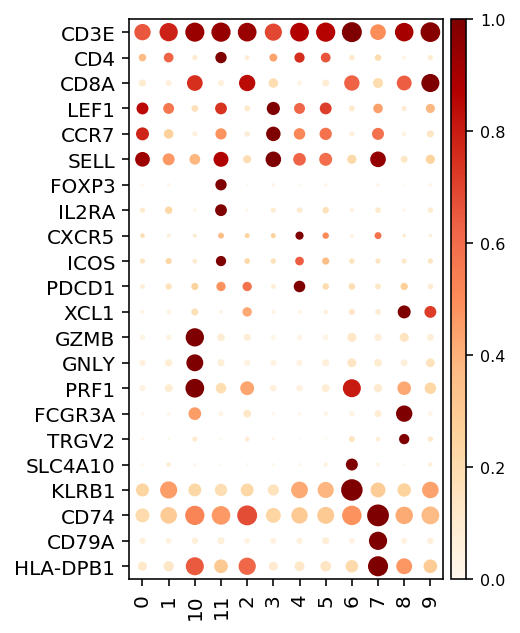

In [782]:
draw_marker_blob(tiss,cdm_out,markersplotting,min_drop_ratio=0)

In [ ]:
#sc.pl.umap(tiss,color=markersplotting, size=20)

In [ ]:
new_cluster_names = [
    'T_CD4_conv', 'T_CD4_conv',
    'T_CD8_activated', 'T_CD4_naive',
    'T_CD4_fh', 'T_CD4_conv',
    'T_CD8_MAIT', 'B_T_doublet',
    'T_CD8_gd', 'T_CD8_activated',
    'T_CD8_CTL', 'T_CD4_reg']

In [ ]:
conv = {str(i):name for i,name in enumerate(new_cluster_names)}

In [ ]:
tiss.obs['anno_1'] = [conv[x] for x in tiss.obs['leiden']]

In [787]:
tiss.write('spleen_T.h5ad')

... storing 'anno_1' as categorical


## Dendritic cells, small clusters and dividing cells

In [788]:
#tiss=sc.read('/home/jovyan/tisstab/data/spleen_div.h5ad')

In [ ]:
tiss=fulldata[[i in ['11', '13','7'] for i in adata.obs['leiden']]]
tiss.obs.donor_time.value_counts()

In [790]:

tiss.raw = sc.pp.log1p(tiss, copy=True)
sc.pp.normalize_per_cell(tiss, counts_per_cell_after=1e4)
filter_result = sc.pp.filter_genes_dispersion(
    tiss.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
#sc.pl.filter_genes_dispersion(filter_result)
tiss = tiss[:, filter_result.gene_subset]
sc.pp.log1p(tiss)
sc.pp.regress_out(tiss, ['n_counts'])


regressing out ['n_counts']
    sparse input is densified and may lead to high memory use
    finished (0:00:29.66)


In [791]:
sc.pp.regress_out(tiss, ['percent_mito'])

regressing out ['percent_mito']
    finished (0:00:30.49)


In [792]:
sc.pp.regress_out(tiss, ['Donor'])

regressing out ['Donor']
    finished (0:00:31.95)


In [793]:
sc.pp.scale(tiss, max_value=10)
sc.tl.pca(tiss)
tiss.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat
bbknn.bbknn(tiss, batch_key='patient',neighbors_within_batch = 4)
sc.tl.umap(tiss)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing batch balanced neighbors
    finished (0:00:01.56) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:15.94) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [794]:
sc.tl.leiden(tiss,resolution=0.9)

running Leiden clustering
    finished (0:00:04.48) --> found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)


In [30]:
#sc.pl.umap(tiss,color=['leiden','Donor'], legend_loc='on data', size=20)

In [18]:
markers=['GP9', 'PF4', 'PPBP', #platelets
                        'CLEC9A', 'XCR1', #DC1
                       'CLEC10A', 'CD1C', #DC2
                        'IL3RA', 'CLEC4C', #pcDC
                        'IL7R', 'KLRB1', 'AREG', 'TNFSF13B', #ILC
                        'CD34', 'HOXA9', 'PROM1', #Progenitor
                       'SDC1','XBP1', 'JCHAIN', # Plasma cells
                       'AICDA', #Somatic hypermutation
                       'MKI67', 'CDK1', #Dividing
                       'NCR1', 'NCAM1', 'CD160',  'FCGR3A', #NK
                         'CD3E', 'TRBC2', #T-cell
                  'CD19', 'CD79A', 
                'MS4A1', #'IGHD', 'FCER2', 'TCL1A', 'YBX3', 'IL4R', 'CR2', 'CD27', 
               # 'TNFRSF13B' #B-cell
                        'CCR7', #Activated DC
                        'CD3E', 'TRBC2' #T-cells
                       ]


In [19]:
#tiss=sc.read('spleen_div.h5ad')
cdm_out = calculate_markers(tiss,'leiden')


0
1
10
11
12
2
3
4
5
6
7
8
9


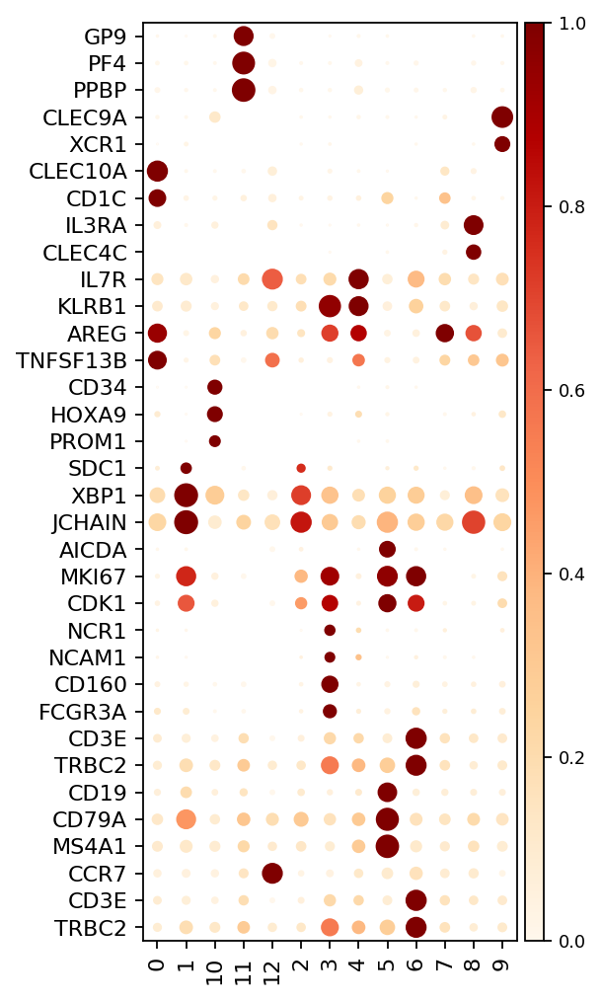

In [20]:
draw_marker_blob(tiss,cdm_out,markers,min_drop_ratio=0)

In [ ]:
#sc.pl.umap(tiss,color=markers, size=20)

In [21]:
new_cluster_names = [
    'DC_2', 'Plasmablast',
    'Plasmablast', 'NK_dividing',
    'ILC', 'B_Hypermutation',
    'T_cell_dividing', 'DC_2',
    'DC_plasmacytoid', 'DC_1',
    'CD34_progenitor', 'Platelet', 'DC_activated']


In [22]:
conv = {str(i):name for i,name in enumerate(new_cluster_names)}


In [23]:
tiss.obs['anno_1'] = [conv[x] for x in tiss.obs['leiden']]

... storing 'anno_1' as categorical


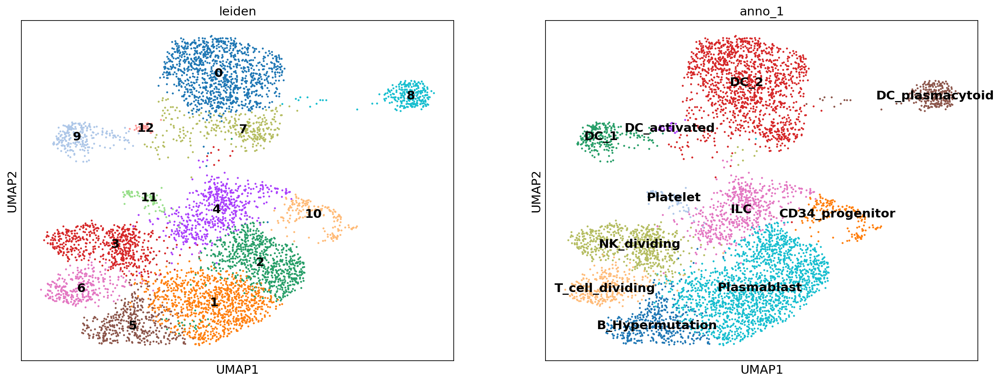

In [24]:
pylab.rcParams['figure.figsize'] = (9, 7)
sc.pl.umap(tiss,color=['leiden','anno_1'], legend_loc='on data', size=20)

In [25]:
tiss.write('spleen_div.h5ad')

## Combine identities

In [21]:
adata = sc.read('spleen.h5ad')
tcells = sc.read('spleen_T.h5ad')
divids = sc.read('spleen_div.h5ad')

In [22]:
adata.obs['cell_types'] = adata.obs['Celltype']

In [23]:
update_label(tcells,'anno_1',adata,'cell_types','cell_types_updated')

In [24]:
update_label(divids,'anno_1',adata,'cell_types_updated','cell_types_updated2')

In [25]:
adata.obs['Celltypes'] = adata.obs['cell_types_updated2']

... storing 'cell_types_updated' as categorical
... storing 'cell_types_updated2' as categorical
... storing 'Celltypes' as categorical


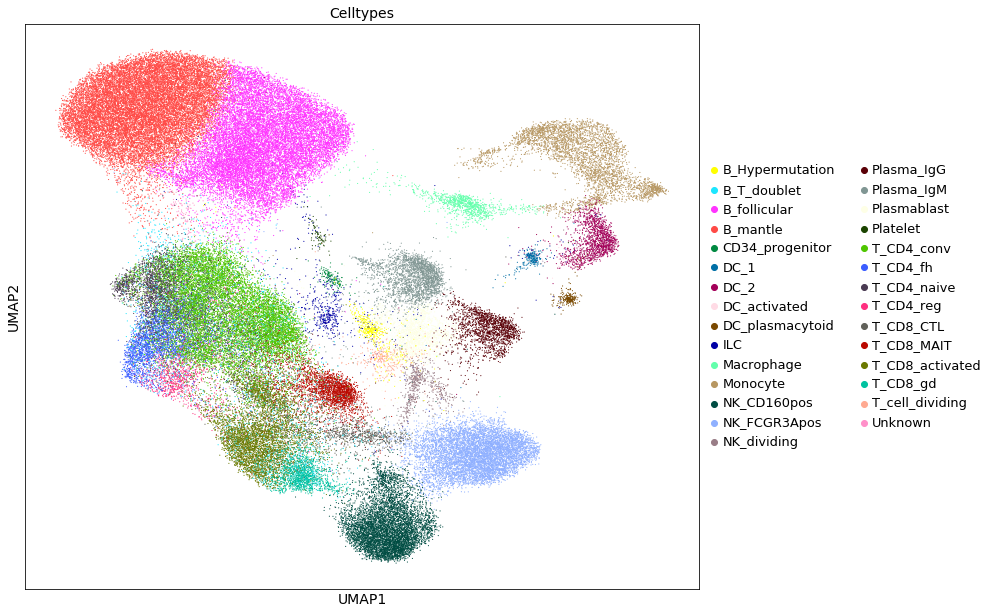

In [26]:
pylab.rcParams['figure.figsize'] = (12, 10)
sc.pl.umap(adata,color=['Celltypes'], #legend_loc='on data', 
           size=5)

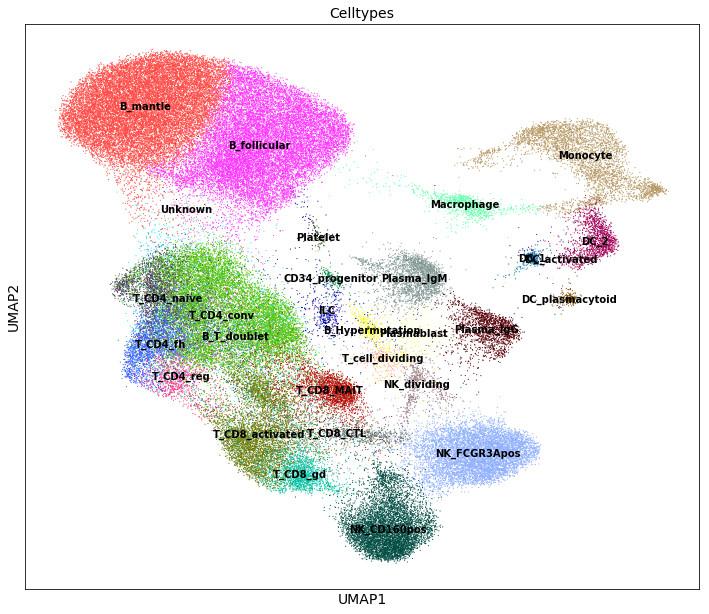

In [27]:
sc.pl.umap(adata,color=['Celltypes'], #legend_loc='on data', 
           size=5, legend_loc='on data')

B_Hypermutation
B_T_doublet
B_follicular
B_mantle
CD34_progenitor
DC_1
DC_2
DC_activated
DC_plasmacytoid
ILC
Macrophage
Monocyte
NK_CD160pos
NK_FCGR3Apos
NK_dividing
Plasma_IgG
Plasma_IgM
Plasmablast
Platelet
T_CD4_conv
T_CD4_fh
T_CD4_naive
T_CD4_reg
T_CD8_CTL
T_CD8_MAIT
T_CD8_activated
T_CD8_gd
T_cell_dividing
Unknown


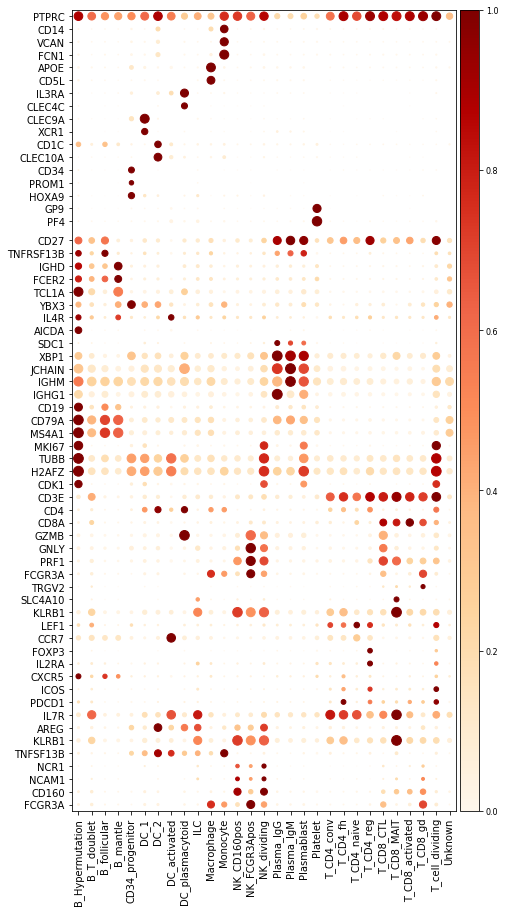

In [28]:
cdm_out = calculate_markers(adata,'Celltypes')
marker_genes_2 = ['PTPRC',#immune
                  'CD14', 'VCAN', 'FCN1', #Monocyte
                  'APOE', 'CD5L',#Macrophage
                  'IL3RA', 'CLEC4C', #plasmacytoid DC
                'CLEC9A', 'XCR1', #cDC1
                  'CD1C',  'CLEC10A', #cDC2
                  'CD34', 'PROM1', 'HOXA9', #Cd34 progenitor
                  'GP9', 'PF4', 'PPBP'#platelets
                  'CR2', 'CD27',  'TNFRSF13B', #Mantle B cells
                  'IGHD', 'FCER2', 'TCL1A', 'YBX3', 'IL4R', #Follicular B cells
                  'AICDA', #Somatic hypermutation B-cells
                  'SDC1', 'XBP1', 'JCHAIN', #Plasma cells
                  'IGHM', 'IGHG1', #Plasma cells
                  'CD19', 'CD79A', 'MS4A1', #B-cell
                  'MKI67', 'TUBB', 'H2AFZ','CDK1', #Dividing
                  'CD3E','CD4', 'CD8A', #T-cells CD4 or CD8
                        'GZMB', 'GNLY', 'PRF1',#Cytotoxic T CTL
                'FCGR3A', 'TRGV2' ,#gamma delta T-cells
                        'SLC4A10',  'KLRB1' ,#MAIT cells
                       'LEF1', 'CCR7', #Naive
                        'FOXP3', 'IL2RA', #Treg
                       'CXCR5', 'ICOS', 'PDCD1',  #Tfh 
                  'IL7R', 'AREG', 'KLRB1','TNFSF13B', #ILC, KLRB1 also marker
                  'NCR1', 'NCAM1', 'CD160', 'FCGR3A',#NK
                       
                       ]
draw_marker_blob(adata,cdm_out,marker_genes_2,min_drop_ratio=0)

In [29]:
adata.write('spleen_annot.h5ad')

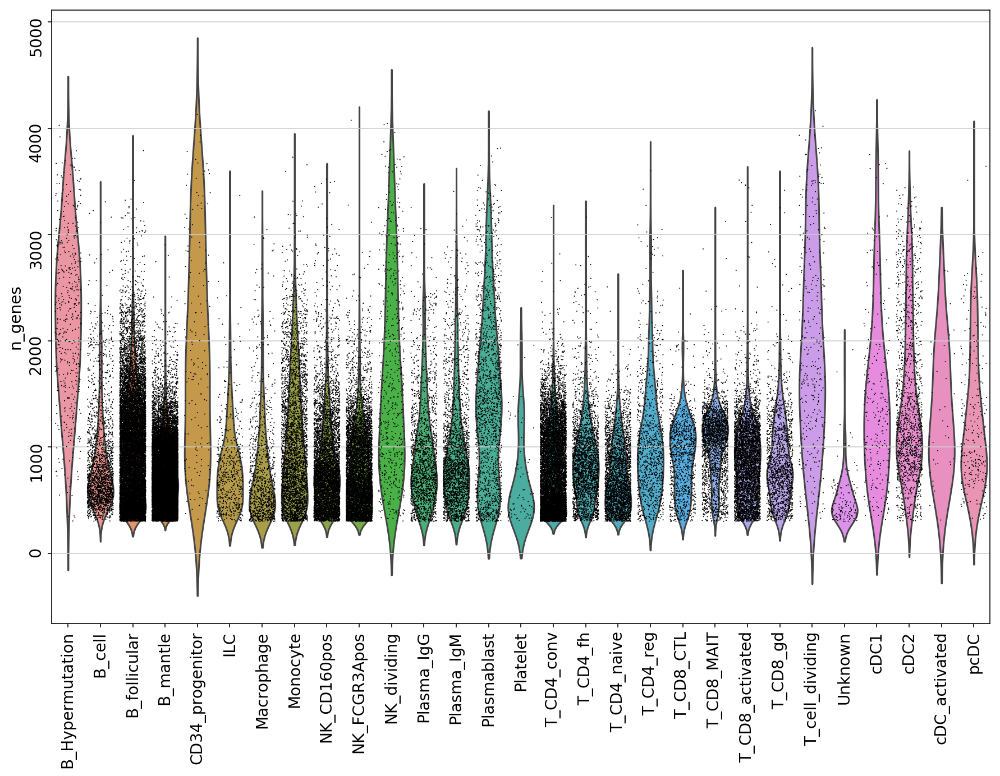

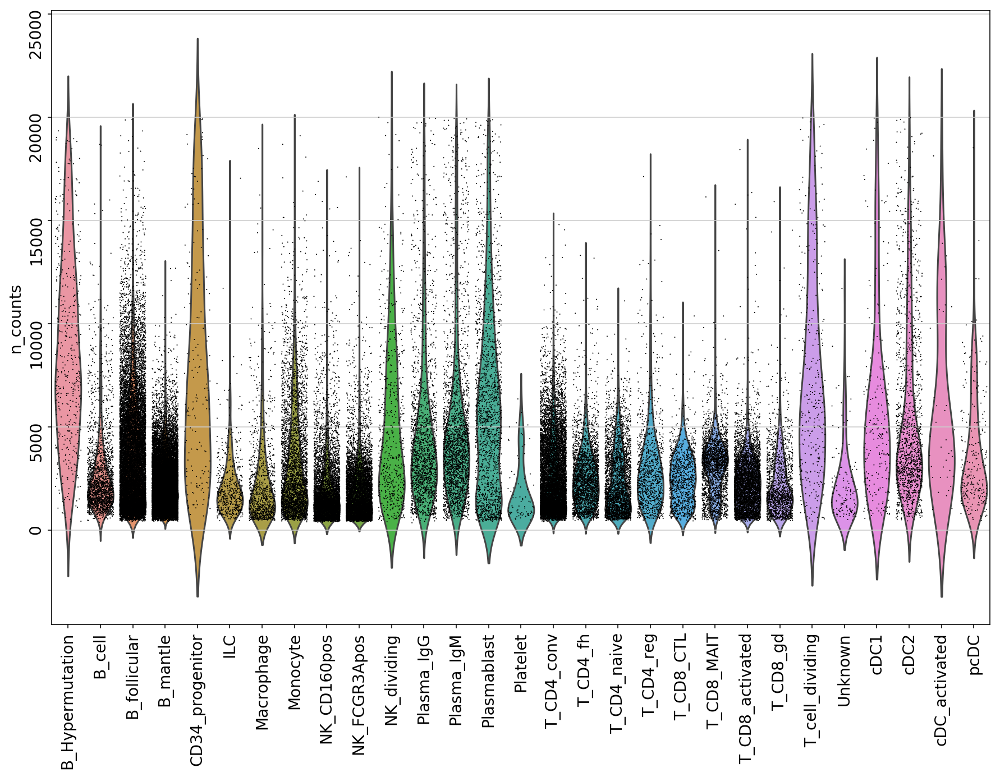

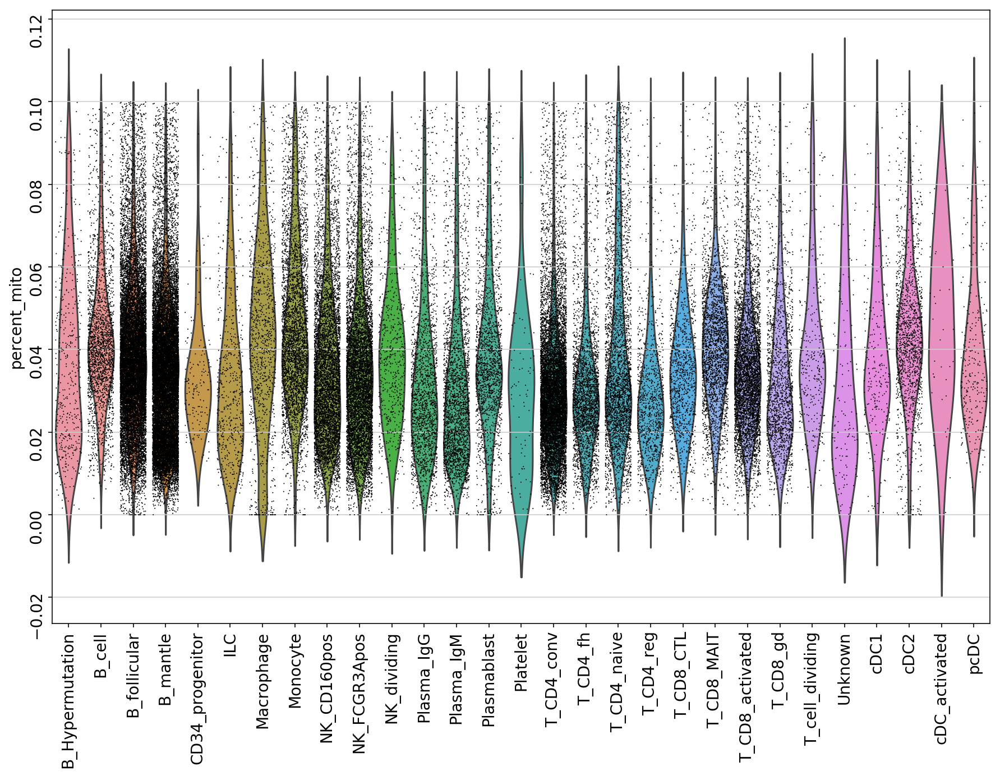

In [814]:
sc.pl.violin(adata, ['n_genes'],
            jitter=0.4, groupby='Celltypes', rotation=90)
sc.pl.violin(adata, ['n_counts'],
            jitter=0.4, groupby='Celltypes', rotation=90)
sc.pl.violin(adata, ['percent_mito'],
            jitter=0.4, groupby='Celltypes', rotation=90)

In [816]:
adata.obs.to_csv("spleen_meta.csv")